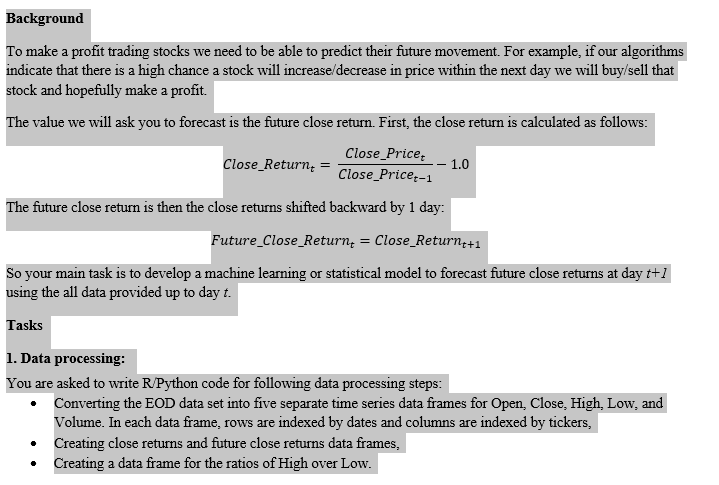

In [1]:
# import sys
# sys.maxint
# !pip install seaborn
# !pip install pyplot

In [2]:
# import numpy as np
import pickle
# import pyplot
import pandas as pd
from matplotlib import pyplot
# import math
# import sklearn
# import sklearn.preprocessing
# import datetime
import os
# import matplotlib.pyplot as plt
# import tensorflow as tf
import glob
import numpy as np
import seaborn as sns
# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(11, 4)})
# # split data in 80%/10%/10% train/validation/test sets
# valid_set_size_percentage = 10 
# test_set_size_percentage = 10 


In [3]:
path = r'C:\Users\Bi PC\3.Data_voc_linh_tinh\ASX-2015-2018'                     # use your path
all_files = glob.glob(os.path.join(path, "*.txt"))     # advisable to use os.path.join as this makes concatenation OS independent

all_files = all_files[:-1] #exclude README file
df_from_each_file = (pd.read_csv(f,header=None) for f in all_files)
df   = pd.concat(df_from_each_file, ignore_index=True)
# doesn't create a list, nor does it append to one

In [4]:
#Ticker, Date, Open, High, Low, Close, and Volume.
df.columns = ['ticker', 'date', 'open', 'high', 'low', 'close',  'volume']
df['date'] =  pd.to_datetime(df['date'], format='%Y%m%d')

# number of different stocks
uniq_stock = list(set(df.ticker))
print('\nnumber of different stocks: ', len(uniq_stock))
print(uniq_stock[:10])
df.head()


number of different stocks:  2773
['A2M', 'MVA', 'LCK', 'EGY', 'CNJ', 'MGT', 'COG', 'ALQ', 'TRA', 'DDT']


,ticker,date,open,high,low,close,volume
0,1PG,2015-01-02,1.195,1.240,1.16,1.215,607639
1,3PL,2015-01-02,2.290,2.290,2.17,2.260,1863
2,8IH,2015-01-02,0.340,0.345,0.34,0.340,112700
3,AAA,2015-01-02,50.100,50.110,50.09,50.110,409863
4,AAC,2015-01-02,1.455,1.470,1.45,1.470,90150


In [5]:
df = df.sort_values(['ticker','date']).reset_index(drop=True)
df['close_return'] = df.groupby('ticker')['close'].pct_change()
df['future_return'] = df['close_return'].shift(periods=-1)
df['hi_lo'] = df['high']/df['low']



df = df.set_index('date')
df.head()

with open(r"main_df.pickle", "wb") as output_file:
    pickle.dump(df, output_file)


# 1. Preprocessing data

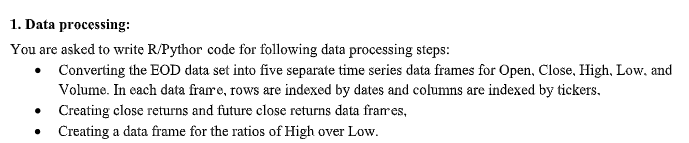

In [6]:
fillna = None

df_open =df.pivot_table(values='open', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_close = df.pivot_table(values='close', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_hi = df.pivot_table(values='high', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_lo = df.pivot_table(values='low', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_vol = df.pivot_table(values='volume', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_clos_re = df.pivot_table(values='close_return', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_fu_re = df.pivot_table(values='future_return', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_hi_lo = df.pivot_table(values='hi_lo', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)

# 2. Exploration

## 2.1. Using the original dataframe

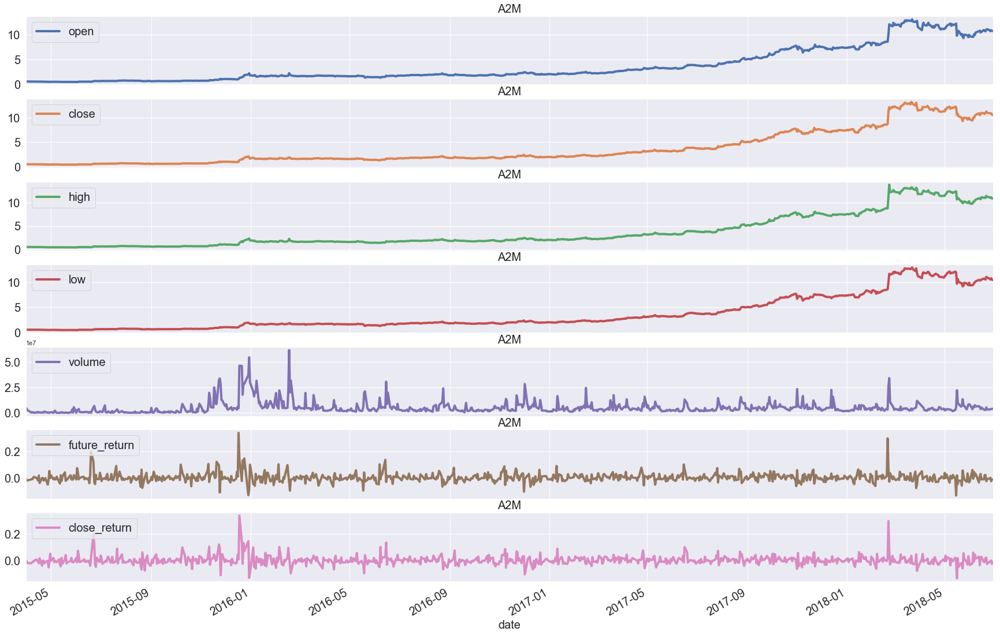

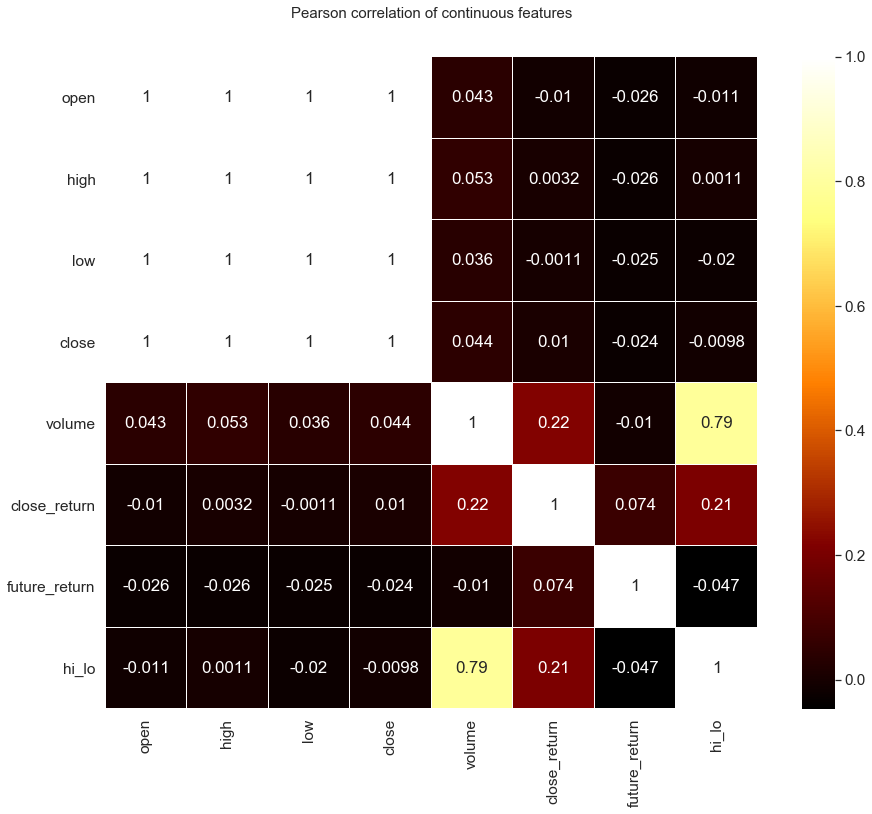

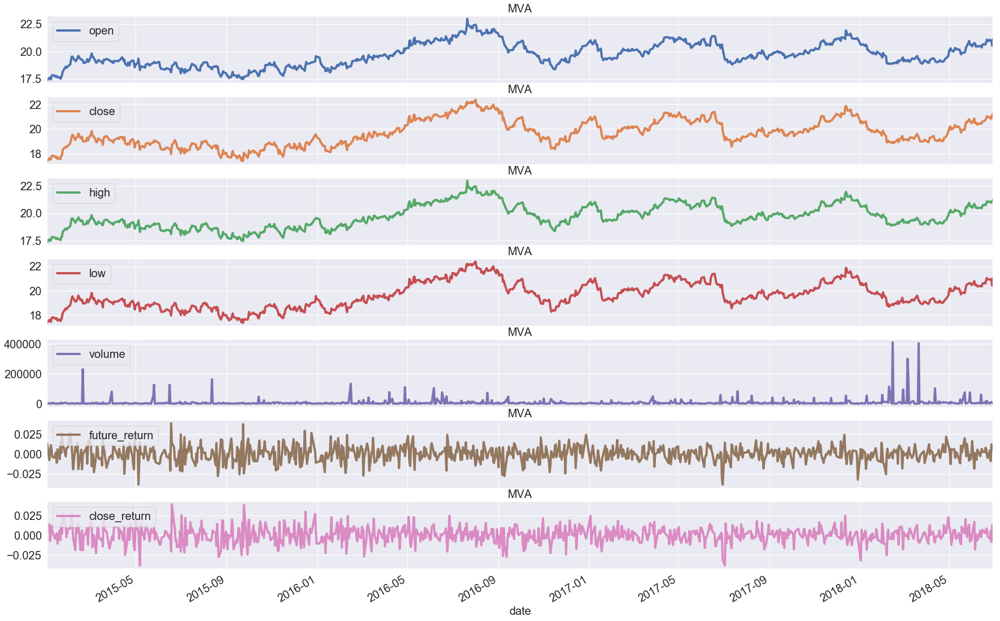

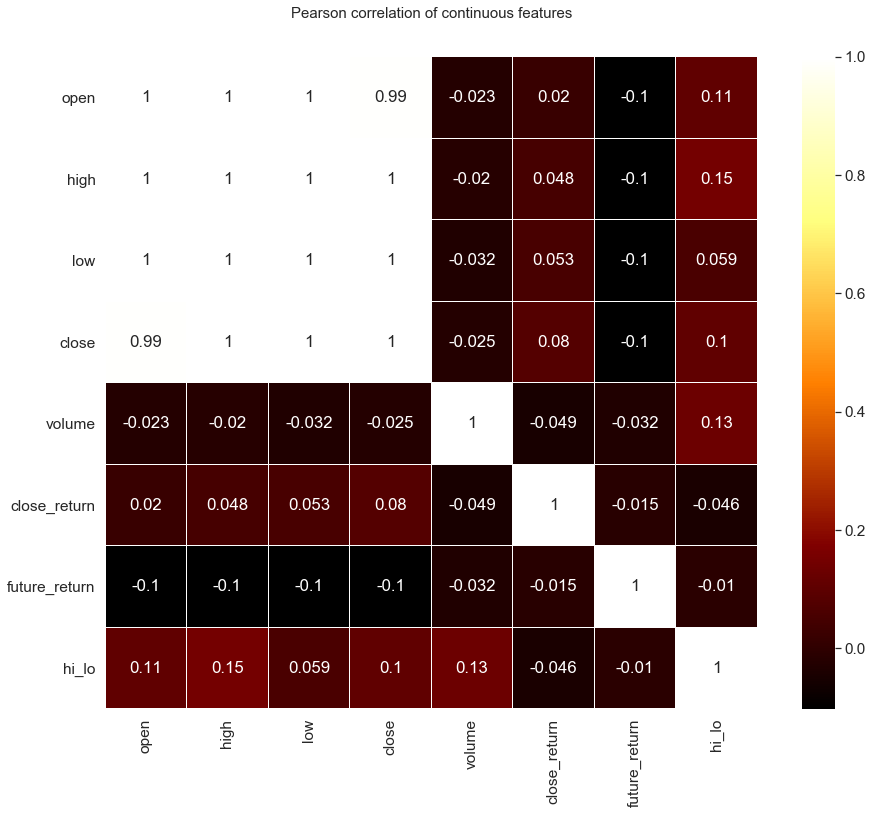

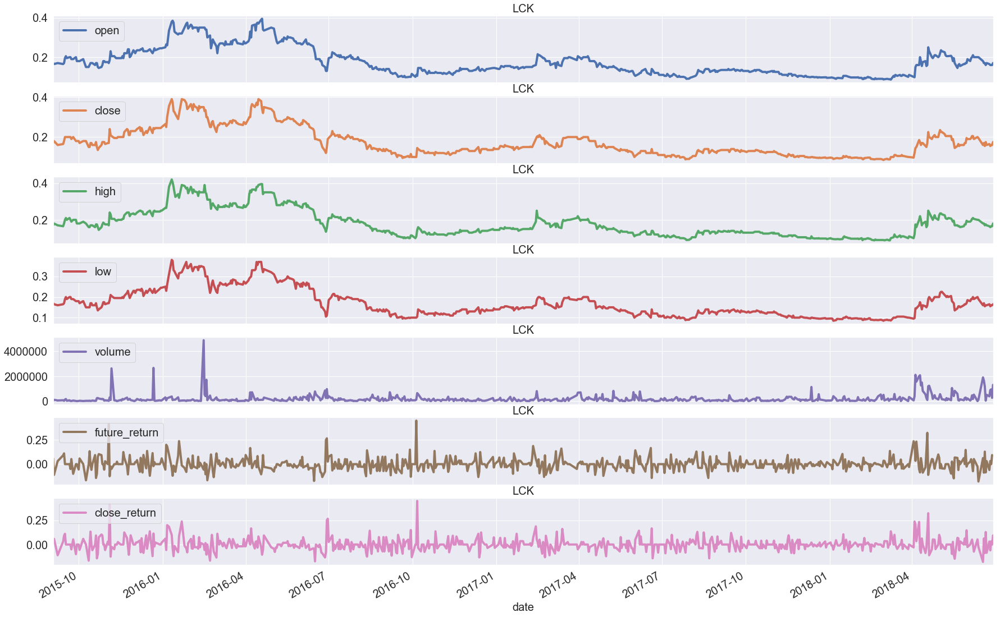

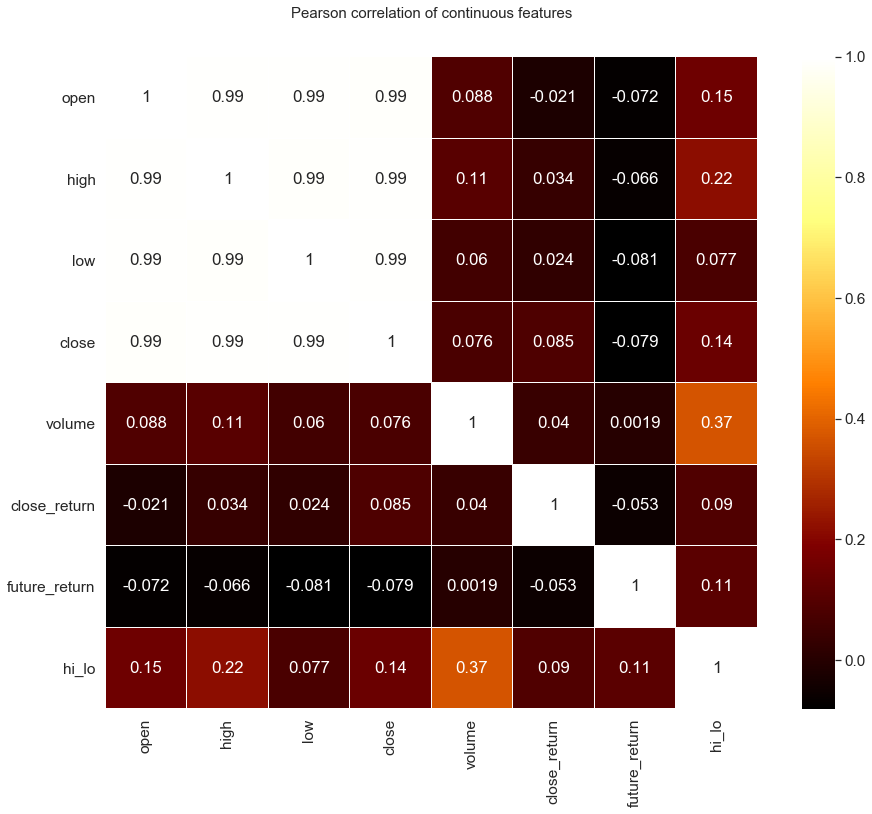

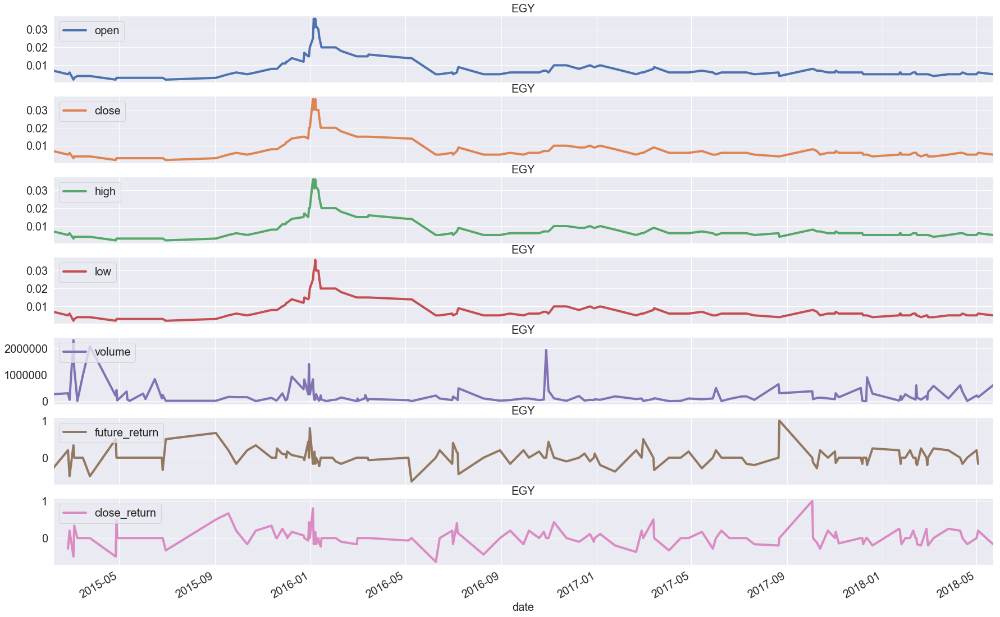

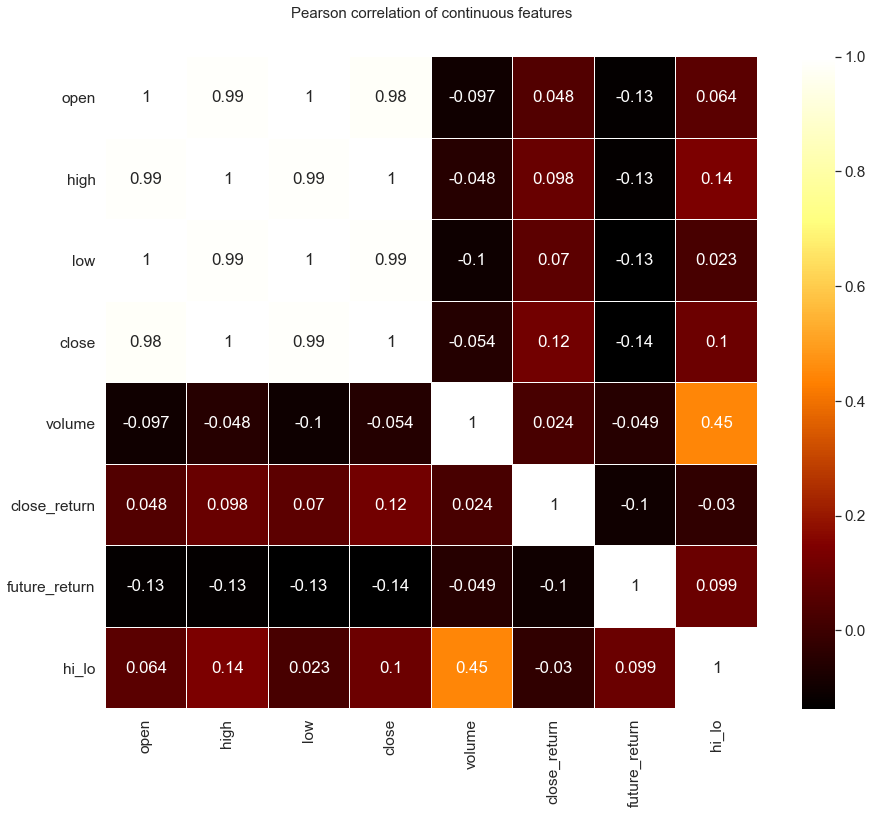

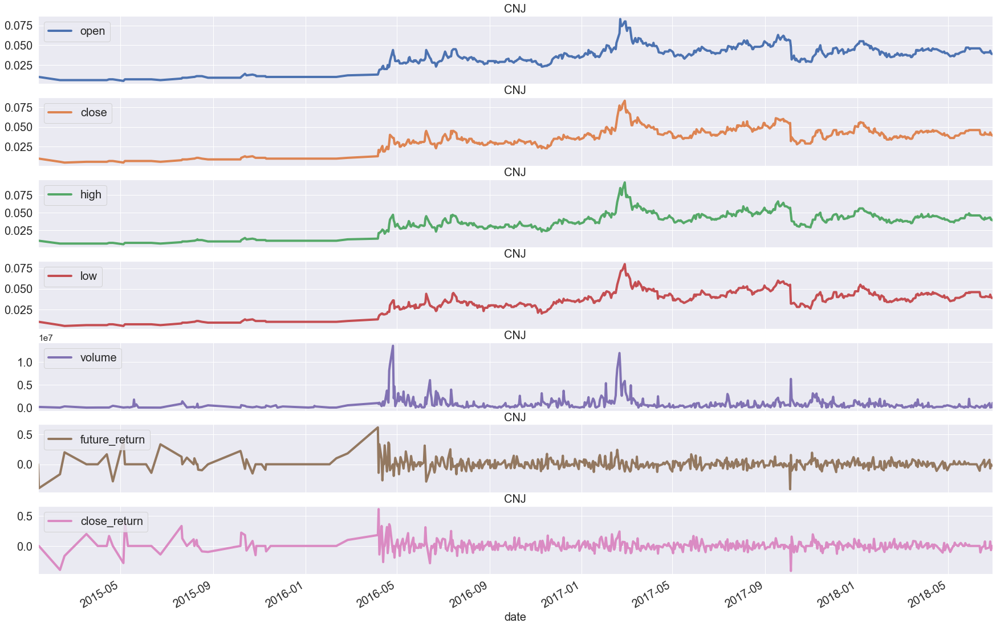

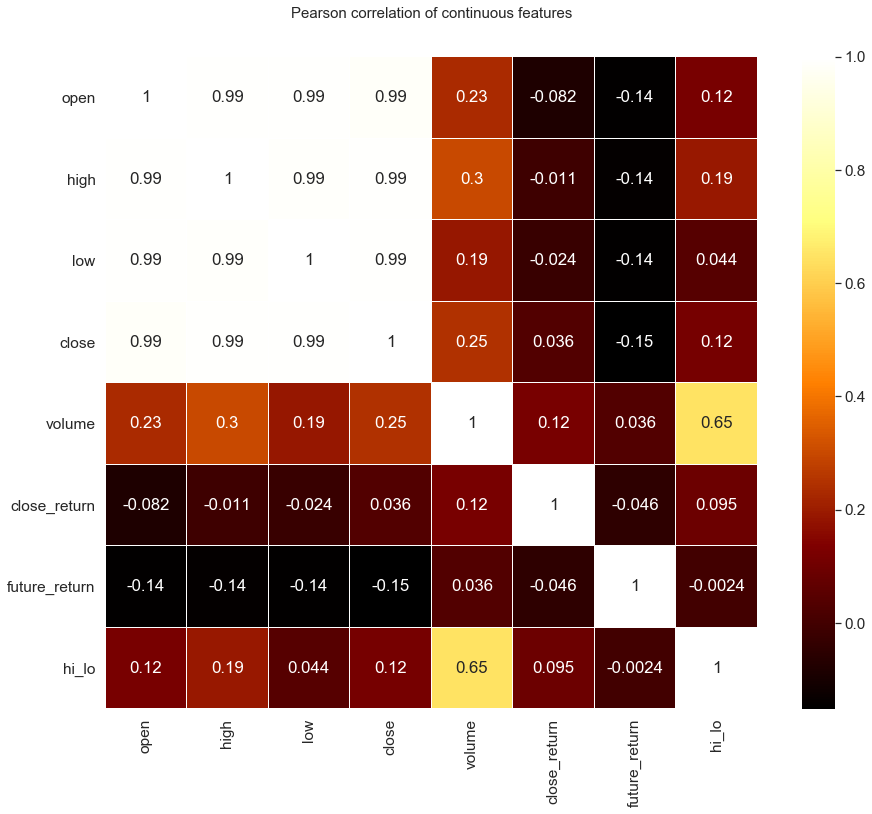

In [7]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cbook as cbook
plt.rcParams.update({'font.size': 40})
years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
years_fmt = mdates.DateFormatter('%Y-%m')

#lets explore first 5 stocks
for idx in range(5):
    select_ticker = uniq_stock[idx]
    selected_df = df[df.ticker== select_ticker]
    cols_plot = ['open', 'close','high','low','volume','future_return','close_return']
    axes = selected_df[cols_plot].plot( alpha=1, linestyle='-', figsize=(30, 20),fontsize=20, linewidth=4, subplots=True)
    for ax in axes:
        #grid and font size
        ax.grid(True)
        ax.set_xlabel('date',fontsize=20)
        ax.set_title(select_ticker,fontsize=20)
        ax.legend(loc=2, fontsize = 20)
    #     ax.set_ylabel('Stock value')
        
        #date adjustment
#         datemin = np.datetime64(selected_df.index[0], 'm')
#         datemax = np.datetime64(selected_df.index[-1], 'm') + np.timedelta64(1, 'm')
#         ax.set_xlim(datemin, datemax)
#         ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
#         

#         ax.xaxis.set_major_locator(months)
#         ax.xaxis.set_major_formatter(years_fmt)
#         ax.xaxis.set_minor_locator(months)
    colormap = pyplot.cm.afmhot
    sns.set(font_scale=1.4)
    pyplot.figure(figsize=(16,12))
    pyplot.title('Pearson correlation of continuous features', y=1.05, size=15)
    sns.heatmap(selected_df.corr(),linewidths=0.1,vmax=1.0, square=True, 
                cmap=colormap, linecolor='white', annot=True)
    pyplot.show()


Open, Close, High, Low are Highly correlated

How about the new 8 created dataframes?
* As we can see some tickers has too much missing data, that can be problematic for our models later, so we can find some tickers that have no missing data
* With all tickers, we can do some exploration as follow

## 2.2. 8 dataframes exploration 

In [8]:
#function to locate which stock has the fullest data
def locate_min(a):
    smallest = min(a)
    return smallest, [index for index, element in enumerate(a) 
                      if smallest == element]
def locate_max(a):
    largest = max(a)
    return largest, [index for index, element in enumerate(a) 
                      if largest == element]

### Find tickers that have no missing data

In [9]:
count_na = []
full_data_ticker = []
for ticker in uniq_stock:
    count_na.append(df_close[ticker].isna().sum())
full_data_ticker_idx = locate_min(count_na)[1]
for idx in full_data_ticker_idx :
    
    full_data_ticker.append(uniq_stock[idx])

len(full_data_ticker)


196

In [10]:
#save data to build Neural Networks
full_ticker_columns = df_close.columns.intersection(full_data_ticker)
full_df = df[df.ticker.isin(full_ticker_columns)]
# with open(r"full_df.pickle", "wb") as output_file:
#     pickle.dump(full_df, output_file)


In [11]:
#data frames with no missing data
df_open_f = df_open[df_open.columns.intersection(full_ticker_columns)]
df_close_f = df_close[df_close.columns.intersection(full_ticker_columns)]
df_hi_f = df_hi[df_hi.columns.intersection(full_ticker_columns)]
df_lo_f = df_lo[df_lo.columns.intersection(full_ticker_columns)]
df_vol_f = df_vol[df_vol.columns.intersection(full_ticker_columns)]
df_clos_re_f = df_clos_re[df_clos_re.columns.intersection(full_ticker_columns)]
df_fu_re_f = df_fu_re[df_fu_re.columns.intersection(full_ticker_columns)]
df_hi_lo_f = df_hi_lo[df_hi_lo.columns.intersection(full_ticker_columns)]

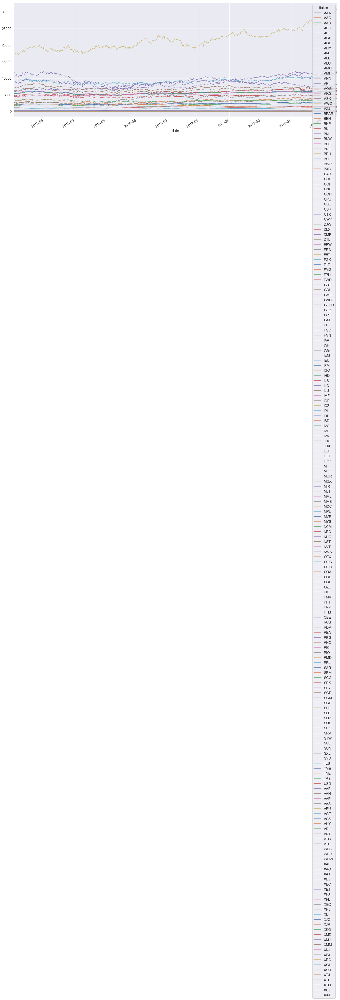

In [12]:
df_open_f.plot(figsize=(25,10),kind='line')

Kinda messy isn't it? so I will select the top 10 and the bottom 10 to analyse the trend

## 2.3. Top 10 , and  Bottom 10 

In [13]:
def plot_10(dataframe,top=True):
    col_list = dataframe.columns
    col_mean = []
    for col in col_list:
        col_mean.append(dataframe[col].mean())
    top10 = sorted(range(len(col_mean)), key=lambda i: col_mean[i])[-10:]
    bot10 = sorted(range(len(col_mean)), key=lambda i: col_mean[i])[:10]
    if top == True:
        plot_df = dataframe.iloc[:, top10]
    else:
        plot_df = dataframe.iloc[:, bot10]
    
    plot_df.plot(figsize=(50,20),fontsize=30,kind='line',linewidth=4)
    plt.legend(fontsize=25)
    plt.grid(True)
    plt.xlabel('date',fontsize=30)
#     plt.title(str(dataframe))

    
#     return plot_df
    

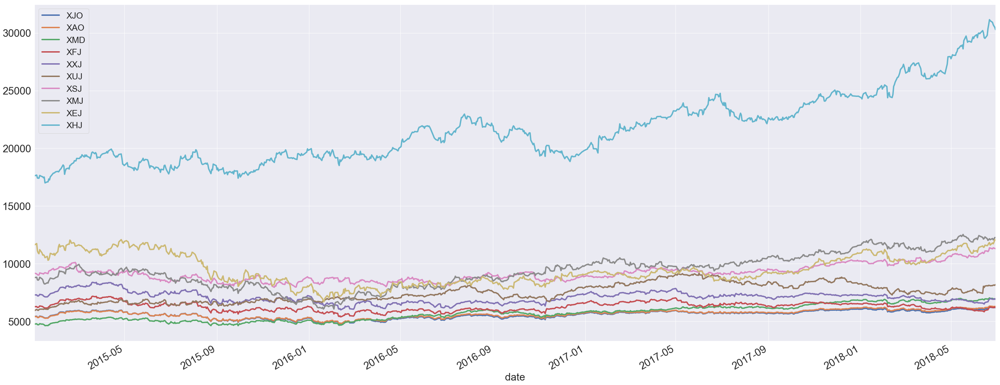

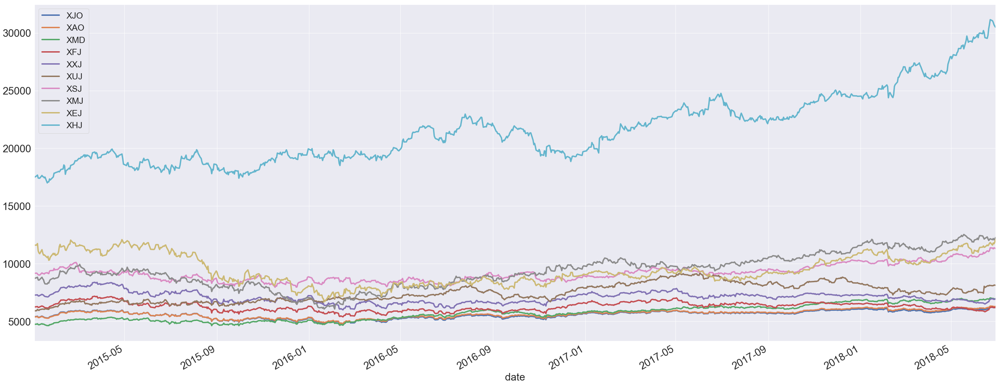

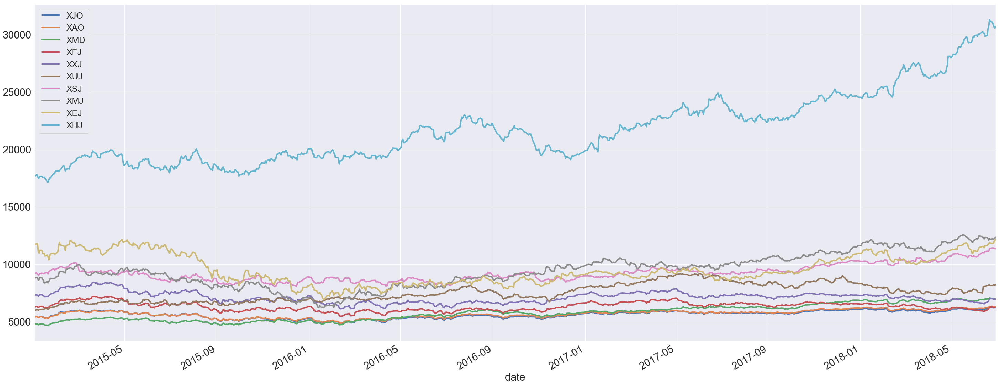

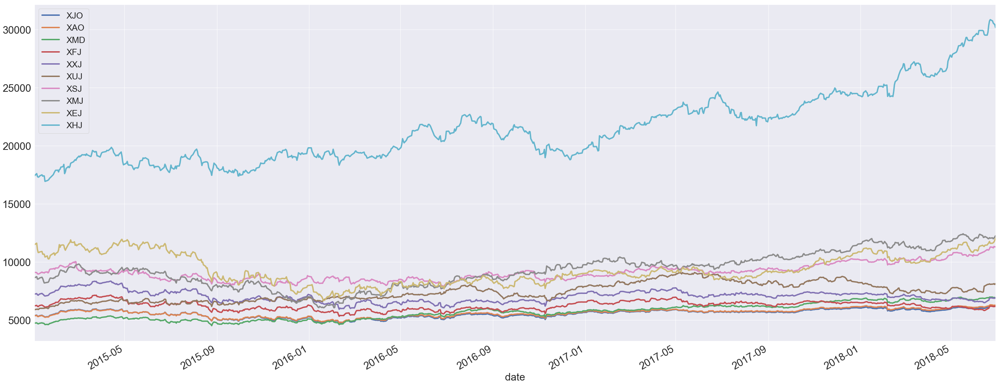

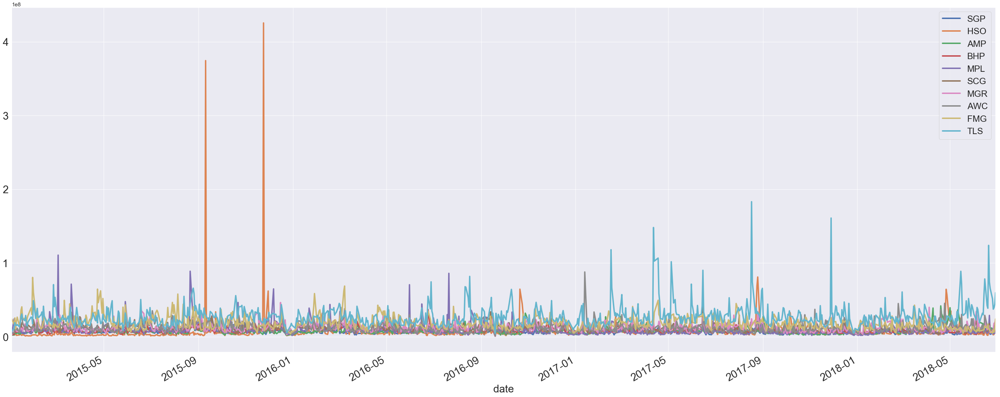

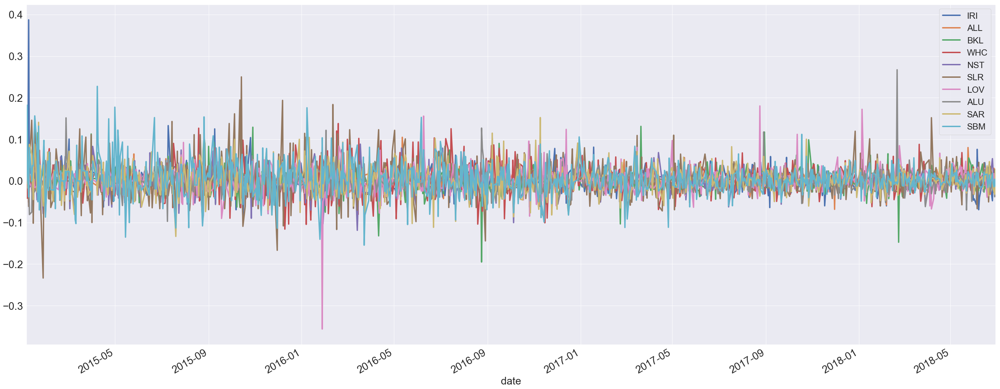

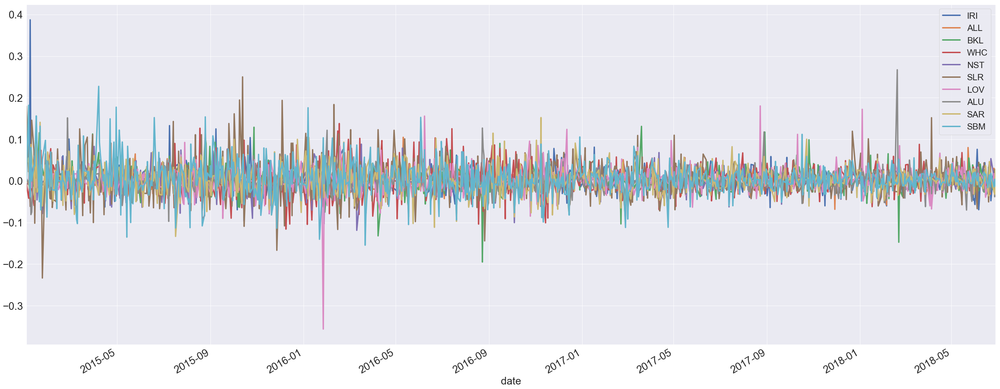

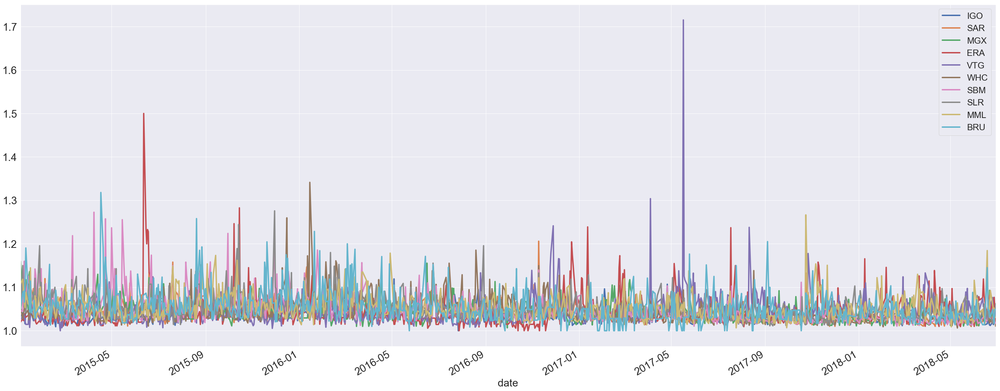

In [14]:
top10 = True
full_df_list = [df_close_f,
                df_open_f,
                df_hi_f,
                df_lo_f,
                df_vol_f,
                df_clos_re_f,
                df_fu_re_f,
                df_hi_lo_f
               ]
#test with opendf
for df in full_df_list:
    plot_10(df,top10)

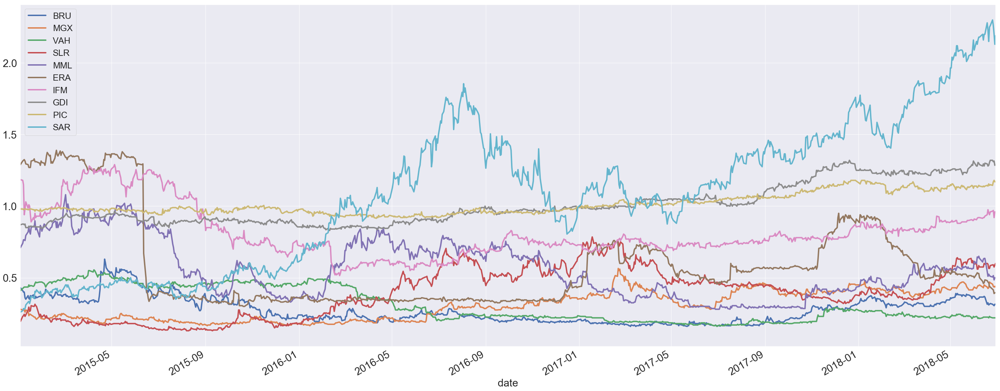

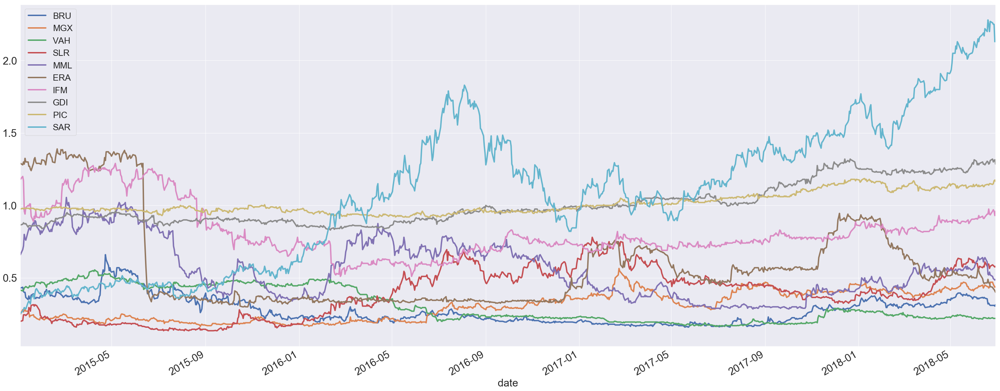

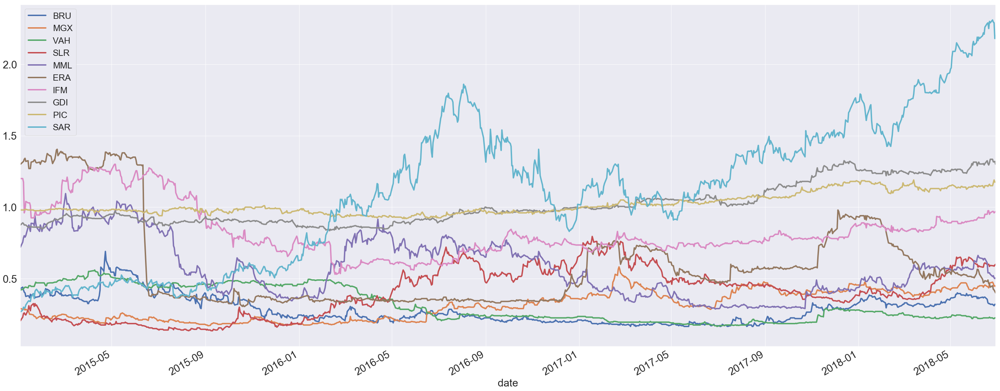

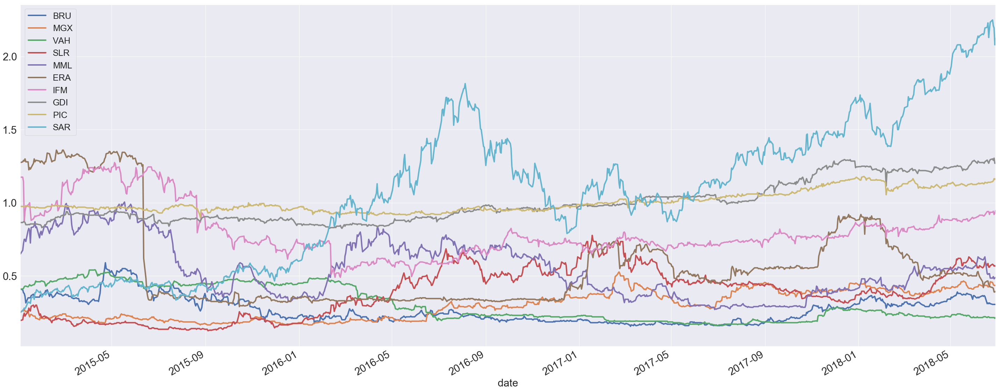

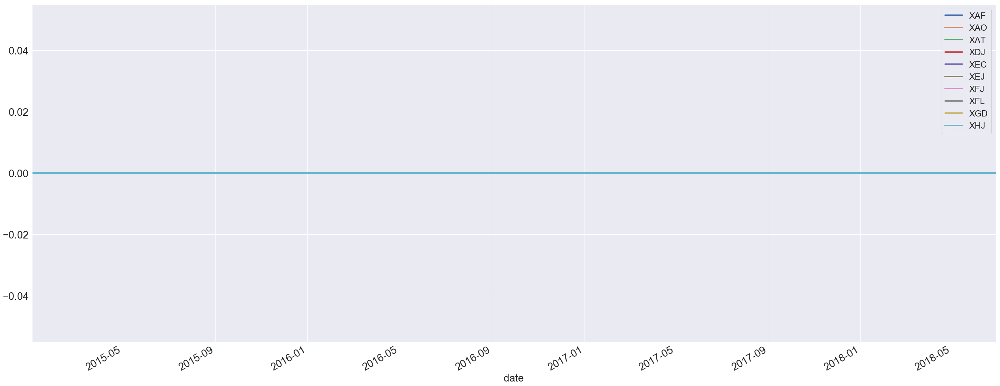

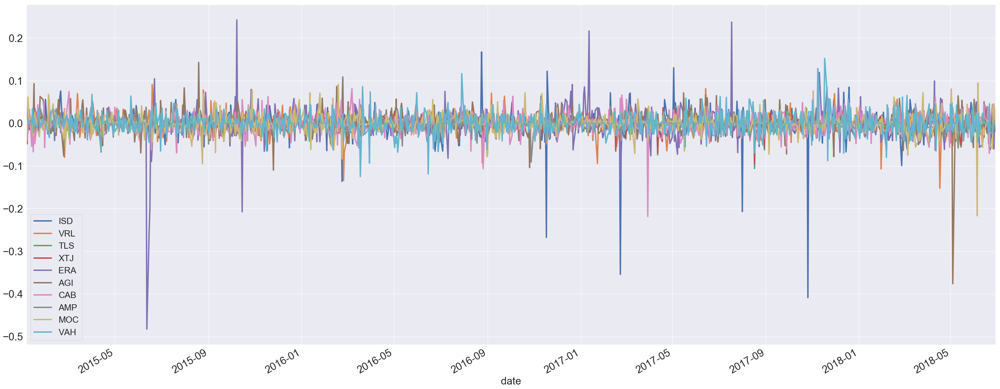

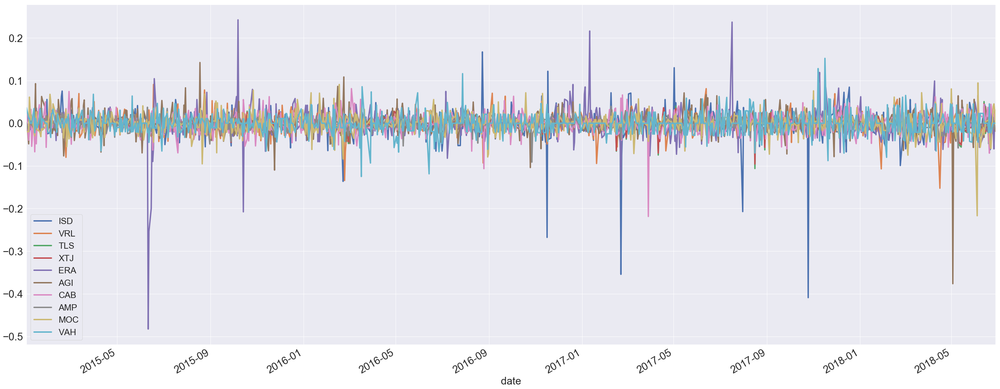

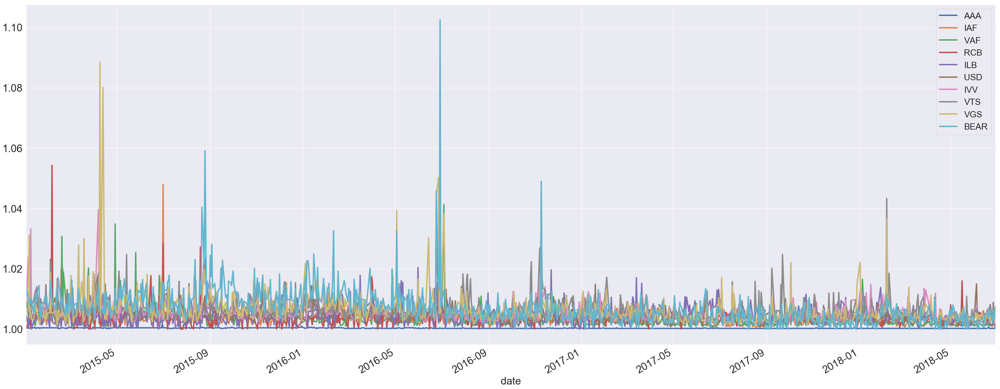

In [15]:
top10 = False
full_df_list = [df_close_f,
                df_open_f,
                df_hi_f,
                df_lo_f,
                df_vol_f,
                df_clos_re_f,
                df_fu_re_f,
                df_hi_lo_f
               ]
#test with opendf
for df in full_df_list:
    plot_10(df,top10)

In [16]:
# delete variables for memory efficiency
del df_open_f 
del df_close_f 
del df_hi_f
del df_lo_f 
del df_vol_f 
del df_clos_re_f 
del df_fu_re_f 
del df_hi_lo_f 
del full_df_list

* Having highly correlated features like high, low, open and close is problematic for simple learning methods like: 
    * linear models (e.g., linear regression or logistic regression), multicolinearity can yield solutions that are wildly varying and possibly numerically unstable.

    * Random forests can be good at detecting interactions between different features, but highly correlated features can mask these interactions.
* However, I to make the most out of all features we currently have, I suggest Using Neural-Network based techniques(**please view this in the second notebook**)

# 3. Build models (simple linear models)
I prefer using h2o library than scikit learn, it fast, it can utilise all our machine resources
and it give my group the rank 5 in our competition 

In [26]:
## Uncomment if you haven't install h2o
# ! pip install requests
# ! pip install tabulate
# ! pip install "colorama>=0.3.8"
# ! pip install future
# ! pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o
# h2o.shutdown()

[WARNING] in <ipython-input-26-0e7abfc35fe2> line 7:
    >>> h2o.shutdown()
        ^^^^ Deprecated, use ``h2o.cluster().shutdown()``.
H2O session _sid_93ce closed.


In [31]:
import h2o
h2o.init(nthreads = -1,ip="localhost", port=54321)

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) Client VM (build 25.211-b12, mixed mode)
  Starting server from C:\Anaconda3\lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\software\Rpackages\temp\tmpavqg2wni
  JVM stdout: C:\software\Rpackages\temp\tmpavqg2wni\h2o_Dev_started_from_python.out
  JVM stderr: C:\software\Rpackages\temp\tmpavqg2wni\h2o_Dev_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,02 secs
H2O cluster timezone:,Australia/Sydney
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.4
H2O cluster version age:,12 days
H2O cluster name:,H2O_from_python_Dev_4kzogh
H2O cluster total nodes:,1
H2O cluster free memory:,247.5 Mb
H2O cluster total cores:,8
H2O cluster allowed cores:,8
H2O cluster status:,"accepting new members, healthy"


## 3.1. Select data for training

* As can be seen in task 2 , high, low, open and close are highly correlated together, so we choose only one amongst 4. We choose close, because it used to model the feature close_return and future return, it might be helpful
* However, I will use all the features and benchmarked by the models in 3.2, so It will be less biased in the feature selection 
* Let's pick one stock among those that have the fullest data to build our model

In [32]:

#new features, to train our model later
full_df['hi-lo'] = full_df['high']-full_df['low']
full_df['sales'] = ((full_df['open']+full_df['close'])/2)*full_df['volume']

with open(r"full_df.pickle", "wb") as output_file:
    pickle.dump(full_df, output_file)

In [33]:
idx = 10
select_ticker = full_data_ticker[idx]
print("selected stock:  ", select_ticker)

#original df with selected stock
model_df = full_df[full_df.ticker== select_ticker]

#removed all correlated features df with selected stock
# model_df = selected_df_ticker.iloc[:,4:] 
model_df.head()

selected stock:   NHC


,ticker,open,high,low,close,volume,close_return,future_return,hi_lo,hi-lo,sales
date,,,,,,,,,,,
2015-01-02,NHC,2.49,2.58,2.45,2.58,71984,NaN,-0.003876,1.053061,0.13,182479.440
2015-01-05,NHC,2.50,2.57,2.50,2.57,37997,-0.003876,0.000000,1.028000,0.07,96322.395
2015-01-06,NHC,2.57,2.57,2.51,2.57,77962,0.000000,-0.023346,1.023904,0.06,200362.340
2015-01-07,NHC,2.52,2.57,2.48,2.51,138190,-0.023346,0.000000,1.036290,0.09,347547.850
2015-01-08,NHC,2.50,2.51,2.45,2.51,51824,0.000000,-0.031873,1.024490,0.06,129819.120


In [34]:
#load into h2o cluster
hf = h2o.H2OFrame(model_df)

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [35]:
#split to train/test : 90/10
train,test = hf.split_frame(ratios=[.9])

### 3.2. Build Simple model : Generalised Linear Model to test our predictors

In [43]:
# Generate a GLM model using the training dataset
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

predictors1 = ["close", "volume", "close_return", "hi_lo","hi-lo","sales"] # my assumption
predictors2 = ["open","high","low","close", "volume", "close_return", "hi_lo","hi-lo","sales"] # all features

response_col = "future_return" #our target

#build glm models with 10-fold-CV

glm_model1 = H2OGeneralizedLinearEstimator(family= "gaussian", lambda_ = 0, nfolds = 10,compute_p_values = True,remove_collinear_columns= True)
glm_model1.train(predictors1, response_col, training_frame= train)

glm_model2 = H2OGeneralizedLinearEstimator(family= "gaussian", lambda_ = 0, nfolds = 10,compute_p_values = True,remove_collinear_columns= True)
glm_model2.train(predictors2, response_col, training_frame= train)


glm Model Build progress: |███████████████████████████████████████████████| 100%
glm Model Build progress: |███████████████████████████████████████████████| 100%


* so... glm_model1 is better than glm_model 2 because we have removed all the highly correlated signal and use only one (open)
* Also, drawing from the tables below, almost all the predictors are useful to predict the future return (p-value <0.01). However the open and close return (of course) seem not to be useful to predict for this model. 
* =>>> Hence, the dataframe with removed correlated features gives better result

In [44]:
glm_model1._model_json['output']['coefficients_table']

Coefficients: glm coefficients



names,coefficients,std_error,z_value,p_value,standardized_coefficients
Intercept,0.1064079,0.2252195,0.4724632,0.6367277,0.0002231
close,-0.0027701,0.0050625,-0.5471762,0.5844134,-0.0010031
volume,0.0000000,0.0000000,1.6999922,0.0895290,0.0437992
close_return,-0.0646272,0.0364910,-1.7710431,0.0769420,-0.0015713
hi_lo,-0.1008617,0.2173397,-0.4640740,0.6427236,-0.0019920
hi-lo,0.0452531,0.1250725,0.3618148,0.7175879,0.0015811
sales,-0.0000000,0.0000000,-1.7005991,0.0894149,-0.0438378


In [45]:
glm_model2._model_json['output']['coefficients_table']

Coefficients: glm coefficients



names,coefficients,std_error,z_value,p_value,standardized_coefficients
Intercept,0.0169384,0.2236164,0.0757477,0.9396392,0.0002314
open,-0.0083805,0.0422541,-0.1983368,0.8428331,-0.0030169
high,0.1174026,0.1253220,0.9368074,0.3491468,0.0428523
low,0.1211314,0.1312781,0.9227088,0.3564436,0.0431734
close,-0.2308873,0.0502670,-4.5932220,0.0000051,-0.0836054
volume,0.0000000,0.0000000,1.1932514,0.2331328,0.0305869
close_return,0.0930612,0.0601878,1.5461806,0.1224655,0.0022626
hi_lo,-0.0147669,0.2157956,-0.0684302,0.9454607,-0.0002916
hi-lo,0.0,nan,nan,nan,0.0
sales,-0.0000000,0.0000000,-1.1948598,0.2325041,-0.0306423


In [46]:
print('removing highly correlated signals:')
print("test_rmse: " ,glm_model1.model_performance(test_data=test).rmse())
print("train_rmse: " ,glm_model1.model_performance(test_data=train).rmse())
print('without removing highly correlated signals:')
print("test_rmse: " ,glm_model2.model_performance(test_data=test).rmse())
print("train_rmse: " ,glm_model2.model_performance(test_data=train).rmse())

removing highly correlated signals:
test_rmse:  0.02154640127399867
train_rmse:  0.02466278538930422
without removing highly correlated signals:
test_rmse:  0.021802953491202298
train_rmse:  0.02433990973694576


### Select the best features for glm training

In [47]:
glm_predictors_final = ["low", "close", "volume"]
glm_model_final = H2OGeneralizedLinearEstimator(family= "gaussian", lambda_ = 0, nfolds = 10,compute_p_values = True,remove_collinear_columns= True)
glm_model_final.train(glm_predictors_final, response_col, training_frame= train)

glm Model Build progress: |███████████████████████████████████████████████| 100%


In [48]:
glm_model_final._model_json['output']['coefficients_table']

Coefficients: glm coefficients



names,coefficients,std_error,z_value,p_value,standardized_coefficients
Intercept,0.0054467,0.0046637,1.1679082,0.2431975,0.0002280
low,0.1126461,0.0294268,3.8280097,0.0001394,0.0401491
close,-0.1133276,0.0289597,-3.9132841,0.0000989,-0.0410364
volume,0.0000000,0.0000000,0.1479272,0.8824381,0.0001295


In [49]:
print("test_rmse: " ,glm_model_final.model_performance(test_data=test).rmse())
print("train_rmse: " ,glm_model_final.model_performance(test_data=train).rmse())

test_rmse:  0.021923305101414516
train_rmse:  0.024525192184450387


## 3.2. Gradient Boosting

gbm Model Build progress: |███████████████████████████████████████████████| 100%


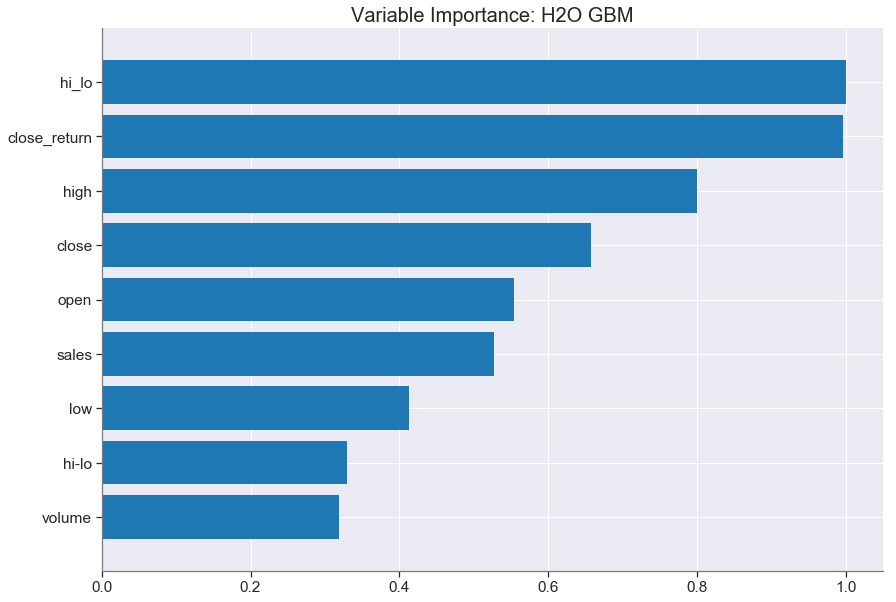

test_rmse:  0.022936650775128267
train_rmse:  0.019725264883976107


In [50]:
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
## Depth 10 is usually plenty of depth for most datasets, but you never know
hyper_params = {'max_depth' : range(1,30,2)}
#hyper_params = {max_depth = [4,6,8,12,16,20]} ##faster for larger datasets

from h2o.estimators.gbm import H2OGradientBoostingEstimator
gbm = H2OGradientBoostingEstimator()


#Train grid search
gbm.train(x=predictors2, 
           y=response_col,
           training_frame = train)
gbm.varimp_plot()
print("test_rmse: " ,gbm.model_performance(test_data=test).rmse())
print("train_rmse: " ,gbm.model_performance(test_data=train).rmse())

gbm Model Build progress: |███████████████████████████████████████████████| 100%


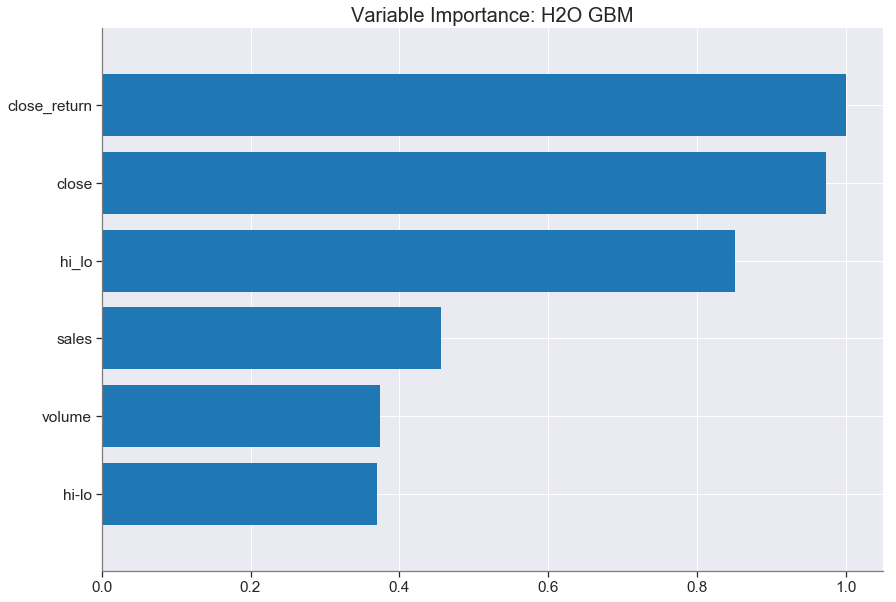

test_rmse:  0.023084786508521225
train_rmse:  0.019907990244525053


In [51]:
gbm.train(x=predictors1, 
           y=response_col,
           training_frame = train)
gbm.varimp_plot()
print("test_rmse: " ,gbm.model_performance(test_data=test).rmse())
print("train_rmse: " ,gbm.model_performance(test_data=train).rmse())

## 3.3. Neural-networks technique with tensorflow - Please visit the second notebook

In [52]:
h2o.shutdown()

[WARNING] in <ipython-input-52-1edf85295eae> line 1:
    >>> h2o.shutdown()
        ^^^^ Deprecated, use ``h2o.cluster().shutdown()``.
H2O session _sid_ae65 closed.
